Hi Team Aftershoot, This Notebook includes:
* Basic details

* Dependencies and setup

* Dataset preparation and augmentations

* Model building

* Training and validation loops with metrics

* Testing on random samples

# Why Face Parsing → Landmark Detection is Better than Direct Landmark Training on Poor Data

## 1. Data Quality Problem in Landmark Annotation
- Many publicly available landmark datasets are small, inconsistent, or noisy.  
- Training a network directly on such “bad” labels leads to overfitting on noise, poor generalization, and unpredictable predictions.  
- Landmarks are very sensitive; a few pixels of error can significantly affect downstream tasks.

## 2. Face Parsing Provides Robust Structural Priors
- Face parsing (semantic segmentation of facial regions like eyes, lips, nose, eyebrows) captures the **underlying geometry** of the face.  
- Even if the original landmark annotations are noisy, the segmentation network can learn **consistent region boundaries**, because semantic labels are more robust and easier to annotate or generate synthetically.  
- This gives a more stable representation than sparse landmarks alone.

## 3. Contour/Centroid Extraction Leverages Structural Information
- Once reliable segmentation masks are available, landmarks can be extracted via **contours** or **centroids**:
  - Centroid of the lip mask → precise mouth center.  
  - Contour of the eye mask → eyelid or pupil landmarks.  
- This approach is **less sensitive to individual annotation errors**, as masks aggregate spatial information over the region.

## 4. Better Generalization
- Landmarks derived from semantically meaningful regions adapt better to variations in pose, lighting, and occlusion.  
- Direct landmark training on noisy data often fails in edge cases (partially occluded eyes, unusual expressions), because the network lacks structural context.

## 5. Practical Benefits
- Reduces dependency on high-quality landmark datasets.  
- Leverages large face parsing datasets, including synthetic augmentation.  
- Easier to debug and visualize predictions.  
- Less prone to catastrophic failure: slight mask errors still yield reasonable landmark estimates.

## 6. Empirical Evidence
- Many state-of-the-art pipelines (3D face reconstruction, AR filters, facial animation) adopt this **two-step approach**: region segmentation → landmark extraction.  
- Especially effective when landmark data is sparse, noisy, or missing for small structures (eyebrows, lip corners, pupils).

---

**Summary:**  
> Instead of asking a network to learn fragile, sparse, and noisy points directly, we teach it the more robust task of segmenting facial regions first. Landmarks then emerge naturally from contours or centroids. This pipeline is **more accurate, robust, interpretable, and generalizable**, particularly in low-quality data scenarios.


# Basic details

### Dataset



I've used the CelebAMask-HQ dataset


```Why CelebAMask-HQ?```

* High-quality, large-scale dataset with 30,000 high-resolution face images.

* Provides pixel-level annotations for 19 semantic classes, including skin, nose, eyes, lips, hair, hat, and more.

* Balanced coverage across genders, skin tones, accessories, and head poses.

* Supports both semantic segmentation (face parsing) and landmark localization (by extracting contours and centroids).


Classes used:
```
0:'background', 1:'skin', 2:'nose', 3:'eye_g', 4:'l_eye',
5:'r_eye', 6:'l_brow', 7:'r_brow', 8:'l_ear', 9:'r_ear',
10:'mouth', 11:'u_lip', 12:'l_lip', 13:'hair', 14:'hat',
15:'ear_r', 16:'neck_l', 17:'neck', 18:'cloth'
```

### Model Architecture


Backbone: U-Net with ResNet50 encoder (pretrained on ImageNet)

Reasoning:

* ResNet50 has deeper representation capability, enabling the model to capture finer details in facial regions.

* Pretraining accelerates convergence and improves generalization.

* U-Net decoder with skip connections helps retain spatial details necessary for fine-grained facial part boundaries.

* Output:

  * Segmentation mask of size (H, W) with class indices from 0–18.

### Training Procedure

* Input preprocessing

  * Images resized to 256×256.

  * Normalized using ImageNet mean/std.

  * Data augmentation: random crops, flips, color jitter, blur (via Albumentations).

* Hyperparameters

  * Optimizer: Adam (lr=1e-4, betas=(0.9, 0.999))

  * Loss: Weighted sum of CrossEntropyLoss + Dice Loss

    * CE for classification per pixel.

    * Dice for handling class imbalance.

  * Batch size: 32

  * Epochs: 15 (best checkpoint saved via validation Combo score).

### Metrics & Results

Metrics:

* Dice Score — for segmentation accuracy across different facial regions.

* Mean Squared Error (MSE) — for landmark regression precision.


Results on Evaluation Split:

* Combo Score: 0.81

  * Large structures (skin, hair, background): >0.9

  * Medium structures (nose, eyes, lips): 0.8–0.85

  * Small structures (eyebrows, ears, hat): ~0.65–0.75

# Dependencies & Setup

### Install Required Libraries

In [1]:
!pip install segmentation-models-pytorch --quiet
!pip install kaggle --quiet

!pip install retina-face --quiet

### Imports

In [2]:
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import re
from collections import defaultdict

import cv2
import glob
import random
import albumentations as A
from albumentations.pytorch import ToTensorV2

import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import torchvision.models as models

import segmentation_models_pytorch as smp
from retinaface import RetinaFace

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

### Google Drive Mount (Colab)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

### Kaggle Dataset Setup

In [3]:
from google.colab import files
files.upload()  # Upload kaggle.json

# Move to correct location
os.makedirs('/root/.kaggle', exist_ok=True)
os.rename('kaggle.json', '/root/.kaggle/kaggle.json')
os.chmod('/root/.kaggle/kaggle.json', 0o600)

# Download dataset
!kaggle datasets download -d ipythonx/celebamaskhq --unzip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/ipythonx/celebamaskhq
License(s): unknown
100% 2.93G/2.94G [01:02<00:00, 44.1MB/s]
100% 2.94G/2.94G [01:02<00:00, 50.4MB/s]


# Data Preprocessing and Dataloader

In [4]:
root_dir = "/content/CelebAMask-HQ/CelebAMask-HQ-mask-anno"

# Regex to match "<number>_<something>"
pattern = re.compile(r"^(\d+)_")
folder_mappings = defaultdict(set)

for folder in os.listdir(root_dir):
    folder_path = os.path.join(root_dir, folder)
    if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
            match = pattern.match(file)
            if match:
                base_number = match.group(1)
                folder_mappings[folder].add(base_number)

for folder, numbers in folder_mappings.items():
    print(f"{folder} → {sorted(numbers)}")

0 → ['00000', '00001', '00002', '00003', '00004', '00005', '00006', '00007', '00008', '00009', '00010', '00011', '00012', '00013', '00014', '00015', '00016', '00017', '00018', '00019', '00020', '00021', '00022', '00023', '00024', '00025', '00026', '00027', '00028', '00029', '00030', '00031', '00032', '00033', '00034', '00035', '00036', '00037', '00038', '00039', '00040', '00041', '00042', '00043', '00044', '00045', '00046', '00047', '00048', '00049', '00050', '00051', '00052', '00053', '00054', '00055', '00056', '00057', '00058', '00059', '00060', '00061', '00062', '00063', '00064', '00065', '00066', '00067', '00068', '00069', '00070', '00071', '00072', '00073', '00074', '00075', '00076', '00077', '00078', '00079', '00080', '00081', '00082', '00083', '00084', '00085', '00086', '00087', '00088', '00089', '00090', '00091', '00092', '00093', '00094', '00095', '00096', '00097', '00098', '00099', '00100', '00101', '00102', '00103', '00104', '00105', '00106', '00107', '00108', '00109', '0011

In [6]:
def random_crop(image, mask, max_ratio=0.25):
    h, w = image.shape[:2]

    crop_top, crop_bottom = np.random.randint(0, int(h * max_ratio) + 1, size=2)
    crop_left, crop_right = np.random.randint(0, int(w * max_ratio) + 1, size=2)

    # Apply crop
    y1, y2 = crop_top, h - crop_bottom
    x1, x2 = crop_left, w - crop_right

    return image[y1:y2, x1:x2], mask[y1:y2, x1:x2]

In [5]:
class CelebAMaskHQ(Dataset):
    def __init__(self, all_images, masks_base, transform, image_size=256, mode="train"):
        self.all_images = all_images
        self.image_size = image_size
        self.masks_base = masks_base
        self.mode = mode
        self.transform = transform

        self.label_list = ['skin', 'nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth', 'u_lip', 'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth']
        self.label_dict = {'skin':1, 'nose':2, 'eye_g':3, 'l_eye':4, 'r_eye':5,
                           'l_brow':6, 'r_brow':7, 'l_ear':8, 'r_ear':9, 'mouth':10,
                           'u_lip':11, 'l_lip':12, 'hair':13, 'hat':14, 'ear_r':15,
                           'neck_l':16, 'neck':17, 'cloth':18}

        if mode != "train":
          self.all_images = sorted([f for f in all_images if f.endswith(".jpg")])

        print(f"Loaded {len(self.all_images)} {self.mode} samples.")

    def __len__(self):
        return len(self.all_images)

    def __getitem__(self, idx):
        image_path = self.all_images[idx]
        file_num = image_path.split("/")[-1].split(".")[0]

        folder_num = int(file_num) // 2000
        im_base = np.zeros((512, 512), dtype=np.uint8)

        for label in self.label_list:
            filename = os.path.join(self.masks_base, str(folder_num), str(file_num).rjust(5, '0') + '_' + label + '.png')

            if (os.path.exists(filename)):
              im = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
              im_base[im != 0] = self.label_dict[label]

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        image = cv2.resize(image, (self.image_size, self.image_size))
        mask = cv2.resize(im_base, (self.image_size, self.image_size), interpolation=cv2.INTER_NEAREST)

        coords = cv2.findNonZero(mask)   # returns (x,y) points
        x, y, w, h = cv2.boundingRect(coords)

        # Crop both image and mask
        image = image[y:y+h, x:x+w]
        mask = mask[y:y+h, x:x+w]

        image, mask = random_crop(image, mask)

        mask = mask.astype(np.uint8)
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented["image"], augmented["mask"].long()
        else:
            image = torch.from_numpy(image).permute(2,0,1).float() / 255.0
            mask = torch.from_numpy(im_base).long()

        return image_path, image, mask

In [7]:
images_dir = "/content/CelebAMask-HQ/CelebA-HQ-img"
masks_base  = "/content/CelebAMask-HQ/CelebAMask-HQ-mask-anno"

img_files = glob.glob(os.path.join(images_dir, "*"))
random.shuffle(img_files)
split = 0.9

split_idx = int(len(img_files) * split)
train_img = img_files[:split_idx]
val_img = img_files[split_idx:]

In [8]:
BATCH_SIZE = 32

train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Affine(translate_percent={"x":0.05, "y":0.05},
             scale=(0.95, 1.05), rotate=(-15, 15), p=0.5),
    A.MotionBlur(blur_limit=7, p=0.3),
    A.ColorJitter(brightness=0.2, contrast=0.2,
                  saturation=0.2, hue=0.1, p=0.5),
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

test_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(
        mean=(0.485, 0.456, 0.406),  # ImageNet mean
        std=(0.229, 0.224, 0.225)    # ImageNet std
    ),
    ToTensorV2(),  # [C,H,W] tensor
])

train_dataset = CelebAMaskHQ(train_img, masks_base, transform=train_transform, image_size=256, mode="train")
test_dataset  = CelebAMaskHQ(val_img, masks_base, transform=test_transform, image_size=256, mode="test")

# Create loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

Loaded 27000 train samples.
Loaded 3000 test samples.


Images shape: torch.Size([3, 256, 256])
Masks shape: torch.Size([256, 256])


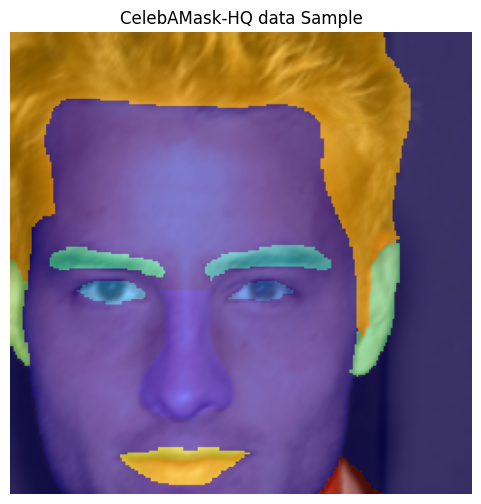

In [75]:
image_path, image, mask = train_dataset[23]
print("Images shape:", image.shape)   # [B,3,H,W]
print("Masks shape:", mask.shape)   # [B,H,W]

plt.figure(figsize=(6,6))

mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

def denormalize(tensor, mean, std):
    return tensor * std + mean

resized_image = denormalize(image, mean, std)
resized_image = resized_image.permute(1,2,0).clamp(0,1).cpu().numpy()  # to [H,W,C] for plotting


# Show original image
plt.imshow(resized_image)

# Overlay mask
plt.imshow(mask*60, cmap="jet", alpha=0.5)
plt.title("CelebAMask-HQ data Sample")
plt.axis("off")
plt.show()

# Model Architecture

In [16]:
# # Reusable double conv block
# class ConvBlock(nn.Module):
#     def __init__(self, in_channels, out_channels):
#         super().__init__()
#         self.block = nn.Sequential(
#             nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
#             nn.BatchNorm2d(out_channels),
#             nn.ReLU(inplace=True),
#             nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
#             nn.BatchNorm2d(out_channels),
#             nn.ReLU(inplace=True),
#         )

#     def forward(self, x):
#         return self.block(x)


# class UNetResNet50(nn.Module):
#     def __init__(self, num_classes, pretrained=True):
#         super().__init__()

#         # Load pretrained ResNet50 as encoder
#         resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1 if pretrained else None)

#         # Encoder layers (ResNet50 backbone)
#         self.enc1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)  # 64
#         self.enc2 = nn.Sequential(resnet.maxpool, resnet.layer1)          # 256
#         self.enc3 = resnet.layer2                                         # 512
#         self.enc4 = resnet.layer3                                         # 1024
#         self.enc5 = resnet.layer4                                         # 2048

#         # Decoder (mirroring UNet with skip connections)
#         self.up4 = nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2)
#         self.dec4 = ConvBlock(1024 + 1024, 1024)

#         self.up3 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
#         self.dec3 = ConvBlock(512 + 512, 512)

#         self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
#         self.dec2 = ConvBlock(256 + 256, 256)

#         self.up1 = nn.ConvTranspose2d(256, 64, kernel_size=2, stride=2)
#         self.dec1 = ConvBlock(64 + 64, 64)

#         # Final segmentation head
#         self.final = nn.Conv2d(64, num_classes, kernel_size=1)

#     def forward(self, x):
#         # Encoder forward
#         e1 = self.enc1(x)   # 64
#         e2 = self.enc2(e1)  # 256
#         e3 = self.enc3(e2)  # 512
#         e4 = self.enc4(e3)  # 1024
#         e5 = self.enc5(e4)  # 2048

#         # Decoder + skip connections
#         d4 = self.up4(e5)
#         d4 = self.dec4(torch.cat([d4, e4], dim=1))

#         d3 = self.up3(d4)
#         d3 = self.dec3(torch.cat([d3, e3], dim=1))

#         d2 = self.up2(d3)
#         d2 = self.dec2(torch.cat([d2, e2], dim=1))

#         d1 = self.up1(d2)
#         d1 = self.dec1(torch.cat([d1, e1], dim=1))

#         # Final segmentation head
#         out = self.final(d1)
#         return out


# model = UNetResNet50(num_classes=NUM_CLASSES, pretrained=True).to(DEVICE)

Hyperparameters

In [76]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_CLASSES = 19   # CelebAMask-HQ classes
EPOCHS = 15
LR = 1e-4

# where to save checkpoints
CHECKPOINT_DIR = "/content/checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [26]:
model = smp.Unet(
    encoder_name= "resnet50", # "resnet34"
    encoder_weights="imagenet", # use pretrained weights
    in_channels=3,
    classes=NUM_CLASSES,
).to(DEVICE)

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

# Training Loop

Cross-Entropy Loss: Standard classification loss

Dice Loss: Good for imbalanced datasets

Combo Loss (Weighted CE + Dice)

In [27]:
class ComboLoss(nn.Module):
    def __init__(self, weight_ce=0.5, weight_dice=0.5):
        super().__init__()
        self.ce = nn.CrossEntropyLoss()
        self.dice = smp.losses.DiceLoss(mode="multiclass")
        self.weight_ce = weight_ce
        self.weight_dice = weight_dice

    def forward(self, pred, target):
        return self.weight_ce * self.ce(pred, target) + \
               self.weight_dice * self.dice(pred, target)

In [28]:
loss_fn = ComboLoss(weight_ce=0.5, weight_dice=0.5)
optimizer = optim.Adam(model.parameters(), lr=LR)

In [ ]:
for epoch in range(1, EPOCHS+1):
    model.train()
    train_loss = 0
    for _, imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS} [Train]", leave=False):

        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = loss_fn(outputs, masks)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    # Validation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for _, imgs, masks in tqdm(test_loader, desc=f"Epoch {epoch}/{EPOCHS} [Val]", leave=False):

            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            outputs = model(imgs)
            loss = loss_fn(outputs, masks)
            val_loss += loss.item()

    print(f"Epoch [{epoch}/{EPOCHS}] "
          f"Train Loss: {train_loss/len(train_loader):.4f} | "
          f"Val Loss: {val_loss/len(test_loader):.4f}")

    # Save weights
    save_path = os.path.join(CHECKPOINT_DIR, f"epoch_{epoch}.pth")
    save_path2 = os.path.join("/content/drive/MyDrive/weights", f"epoch_{epoch}.pth")
    torch.save(model.state_dict(), save_path)
    torch.save(model.state_dict(), save_path2)
    print(f"✅ Saved: {save_path} and {save_path2}")

# Inference

The models is only trained for 11 epochs because of hardware limitations.

### Helper utilities

In [77]:
def mask_to_landmark_points(mask, label_dict, total_points=100):
    key_features = ['nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow',
                    'l_ear', 'r_ear', 'mouth', 'u_lip', 'l_lip', 'skin']

    # Assign relative point weights
    feature_weights = {
        'nose': 0.15, 'eye_g': 0.06, 'l_eye':0.1, 'r_eye':0.1,
        'l_brow':0.1, 'r_brow':0.1, 'l_ear':0.05, 'r_ear':0.05,
        'u_lip':0.1, 'l_lip':0.1, 'skin':0.3, 'mouth':0.08,
    }

    landmarks = {}

    # Compute points for each class
    for idx, part in label_dict.items():
        if part not in key_features:
            continue

        ys, xs = np.where(mask == idx)
        num_pixels = len(xs)
        if num_pixels == 0:
            landmarks[part] = None
            continue

        # Number of points proportional to weight
        n_points = max(1, int(total_points * feature_weights.get(part, 0.05)))

        mask_bin = (mask==idx).astype(np.uint8)
        contours, _ = cv2.findContours(mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        pts = []
        for c in contours:
            c = c.reshape(-1,2)
            if len(c) > 0:
                sample_indices = np.linspace(0, len(c)-1, num=min(len(c), n_points), dtype=int)
                pts.extend(c[sample_indices])

        landmarks[part] = pts

    return landmarks

In [71]:
def plot_landmarks_on_image(image, landmarks, radius=None):
    img = image.copy()
    h, w = img.shape[:2]

    # Smaller radius for dots
    if not radius:
        radius = max(2, int(min(h, w) * 0.008))  # ~0.8% of smaller dimension
    font_scale = max(0.3, min(h, w) * 0.001)  # slightly smaller text
    thickness = max(1, int(min(h, w) * 0.003))

    for part, points in landmarks.items():
        if points is None:
            continue
        for (x, y) in points:
            cv2.circle(img, (int(x), int(y)), radius, (0,0,255), -1, lineType=cv2.LINE_AA)  # red round dot

        # Label near first point
        if not radius:
          x0, y0 = points[0]
          cv2.putText(img, part, (int(x0+radius), int(y0-radius)),
                      cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0,255,0), thickness, cv2.LINE_AA)

    plt.figure(figsize=(max(8,w/100), max(8,h/100)))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Landmarks on Face")
    plt.show()

In [31]:
def calculate_mask_percentages(mask, label_dict):
    total_pixels = mask.size
    percentages = {}

    for class_id, class_name in label_dict.items():
        class_pixels = np.sum(mask == class_id)
        percent = (class_pixels / total_pixels) * 100
        percentages[class_name] = percent

    return percentages

In [62]:
def refine_mask_by_islands(mask, label_dict, min_pixels=50):
    refined_mask = np.zeros_like(mask, dtype=np.uint8)

    for class_id in label_dict.keys():
        class_mask = (mask == class_id).astype(np.uint8)

        # Always keep small but important facial parts
        if label_dict[class_id] in ['eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow',
                                    'l_ear', 'r_ear', 'u_lip', 'l_lip']:
            refined_mask[class_mask == 1] = class_id
        elif label_dict[class_id] in ['neck_l', 'neck', 'cloth', 'hair', 'hat', 'ear_r']:
            continue
        else:
            # Keep only large connected components
            num_labels, labels = cv2.connectedComponents(class_mask)
            for i in range(1, num_labels):
                island = (labels == i)
                if np.sum(island) >= min_pixels:
                    refined_mask[island] = class_id

    return refined_mask

In [33]:
def visualize_mask_with_legend(image, mask, label_dict, colors, alpha=0.5):
    overlay = image.copy()
    for idx, part in label_dict.items():
        overlay[mask == idx] = ((1 - alpha) * overlay[mask == idx] + alpha * np.array(colors[idx])).astype(np.uint8)

    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    # Only show legend for IDs present in the mask
    present_ids = np.unique(mask)
    patches = [mpatches.Patch(color=np.array(colors[k])/255.0, label=f"{k}: {label_dict[k]}")
               for k in present_ids if k in label_dict]

    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title("Segmentation Overlay with Legend")
    plt.show()

In [34]:
def update_mask_with_priority(overall_mask, pred_mask_resized, x1, y1, x2, y2):

    # Priority order (lower = higher priority)
    priority_order = [
        2,  # nose
        4,  # l_eye
        5,  # r_eye
        6,  # l_brow
        7,  # r_brow
        11, # u_lip
        12, # l_lip
        8,  # l_ear
        9,  # r_ear
        10, # mouth
        15, # ear_r
        3,  # eye_g
        13, # hair
        16, # neck_l
        17, # neck
        1,  # skin
        14, # hat
        18, # cloth
        0   # background
    ]

    priority_map = {cls_id: rank for rank, cls_id in enumerate(priority_order)}

    current_region = overall_mask[y1:y2, x1:x2].copy()
    new_region = pred_mask_resized

    current_priority = np.vectorize(priority_map.get)(current_region)
    new_priority = np.vectorize(priority_map.get)(new_region)

    mask_update = new_priority < current_priority
    current_region[mask_update] = new_region[mask_update]

    overall_mask[y1:y2, x1:x2] = current_region
    return overall_mask

In [35]:
label_dict = {
    0:'background', 1:'skin', 2:'nose', 3:'eye_g', 4:'l_eye', 5:'r_eye',
    6:'l_brow', 7:'r_brow', 8:'l_ear', 9:'r_ear', 10:'mouth',
    11:'u_lip', 12:'l_lip', 13:'hair', 14:'hat', 15:'ear_r',
    16:'neck_l', 17:'neck', 18:'cloth'
}

colors = {
    0: (0, 0, 0),        # background
    1: (128, 0, 0),      # skin
    2: (0, 128, 0),      # nose
    3: (128, 128, 0),    # eye_g
    4: (0, 0, 128),      # l_eye
    5: (128, 0, 128),    # r_eye
    6: (0, 128, 128),    # l_brow
    7: (128, 128, 128),  # r_brow
    8: (64, 0, 0),       # l_ear
    9: (192, 0, 0),      # r_ear
    10: (64, 128, 0),    # mouth
    11: (192, 128, 0),   # u_lip
    12: (64, 0, 128),    # l_lip
    13: (192, 0, 128),   # hair
    14: (64, 128, 128),  # hat
    15: (192, 128, 128), # ear_r
    16: (0, 64, 0),      # neck_l
    17: (128, 64, 0),    # neck
    18: (0, 192, 0),     # cloth
}

### Testing Regular Images

In [41]:
test_image_path = "group2.jpg"
testing_checkpoint = "/content/epoch_11.pth"

✅ Model loaded and ready.
✅ Detector retinaface loaded.
Detected boxes: [(np.int64(926), np.int64(169), np.int64(991), np.int64(260)), (np.int64(1155), np.int64(234), np.int64(1228), np.int64(327)), (np.int64(672), np.int64(162), np.int64(739), np.int64(254)), (np.int64(587), np.int64(186), np.int64(651), np.int64(270)), (np.int64(1352), np.int64(173), np.int64(1416), np.int64(259)), (np.int64(412), np.int64(261), np.int64(478), np.int64(341)), (np.int64(519), np.int64(226), np.int64(590), np.int64(327)), (np.int64(767), np.int64(186), np.int64(830), np.int64(266)), (np.int64(1443), np.int64(188), np.int64(1509), np.int64(282)), (np.int64(1211), np.int64(581), np.int64(1284), np.int64(681)), (np.int64(579), np.int64(596), np.int64(644), np.int64(677)), (np.int64(1270), np.int64(270), np.int64(1335), np.int64(350)), (np.int64(1270), np.int64(194), np.int64(1334), np.int64(272)), (np.int64(973), np.int64(194), np.int64(1036), np.int64(280)), (np.int64(431), np.int64(575), np.int64(504), 

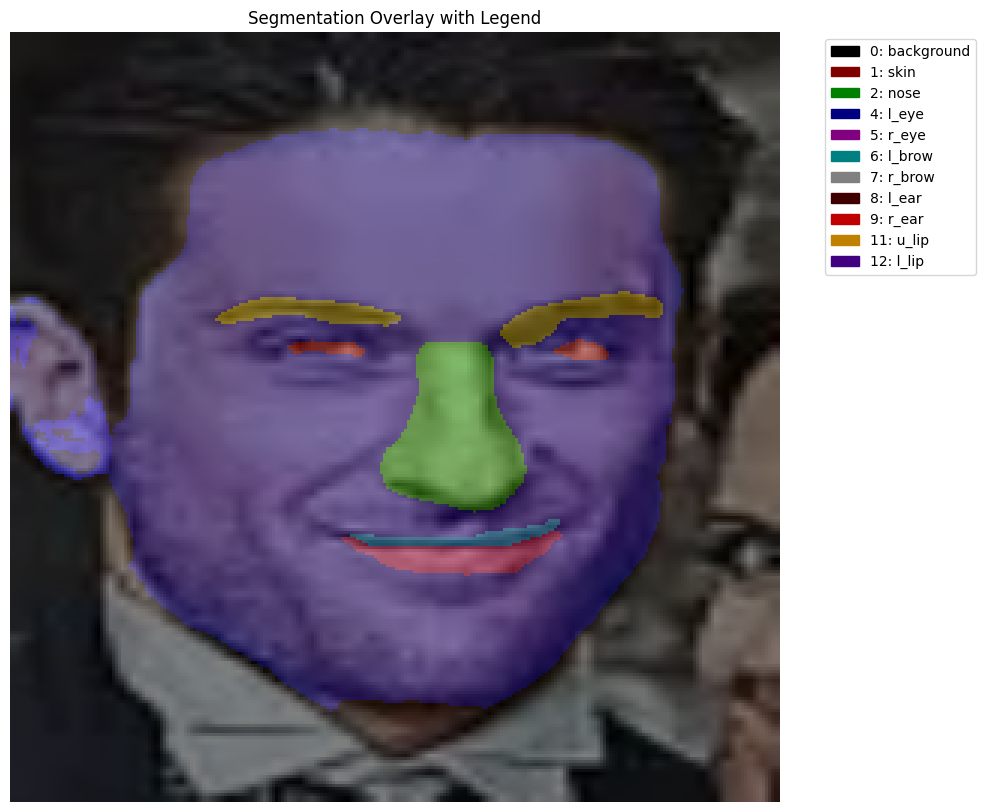

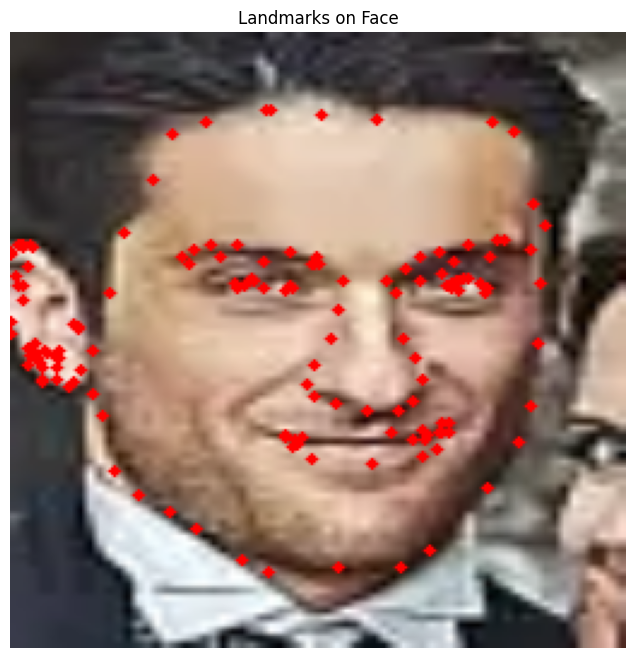

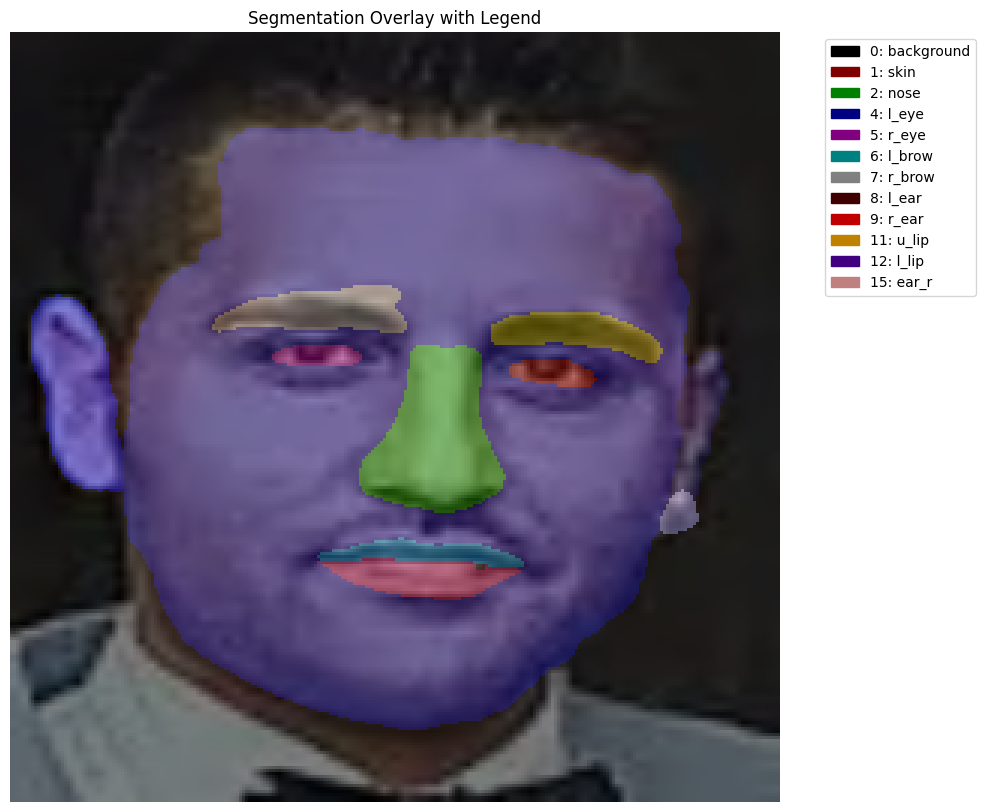

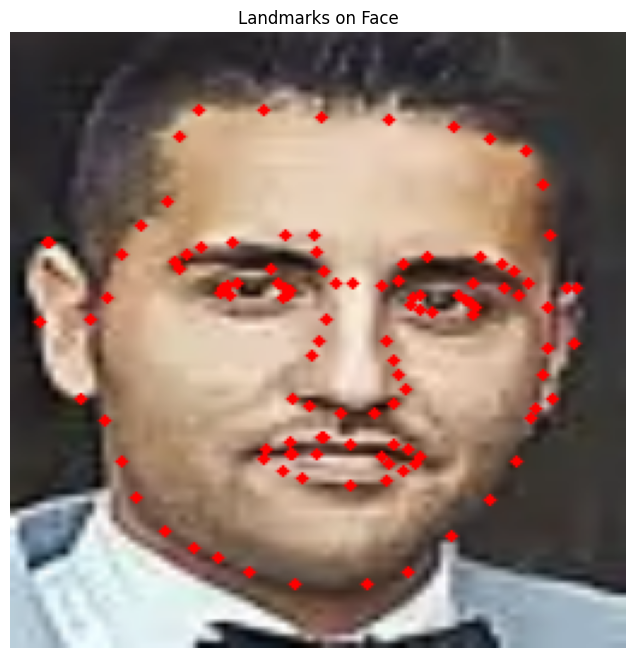

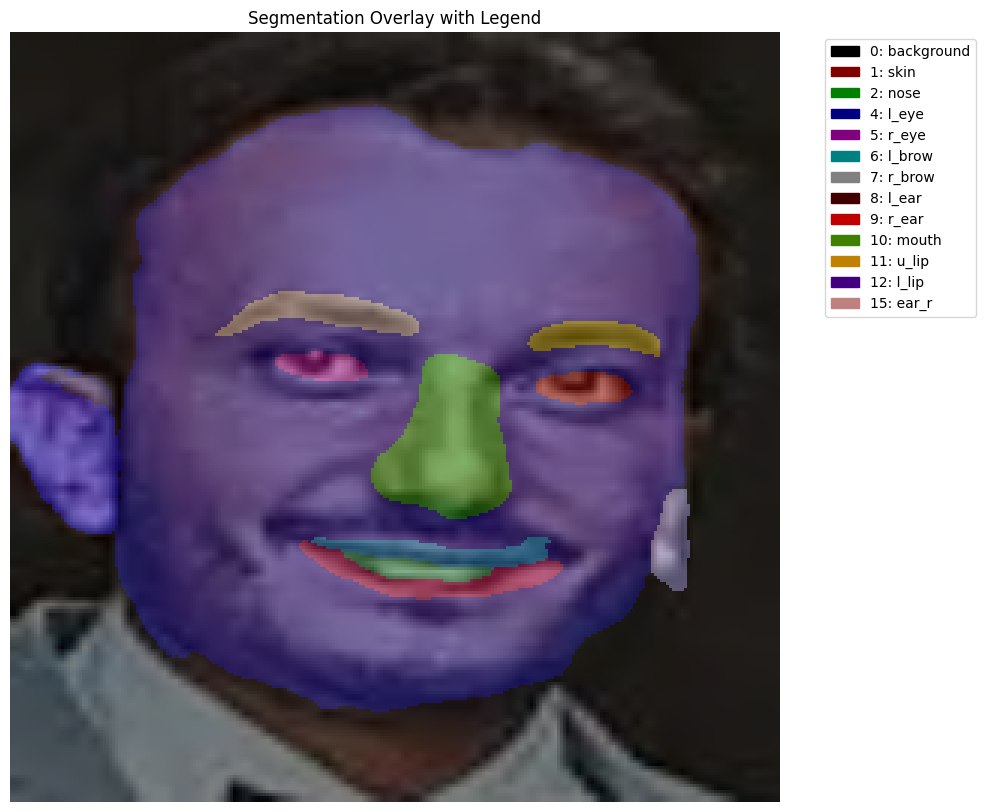

...

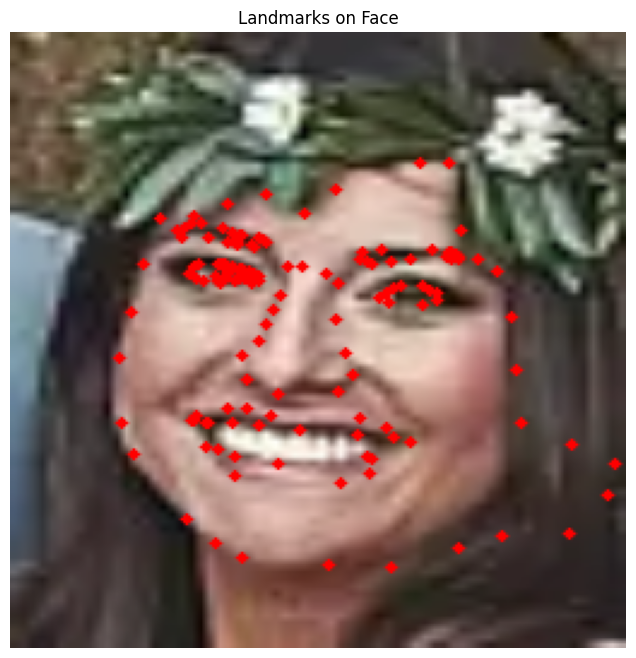

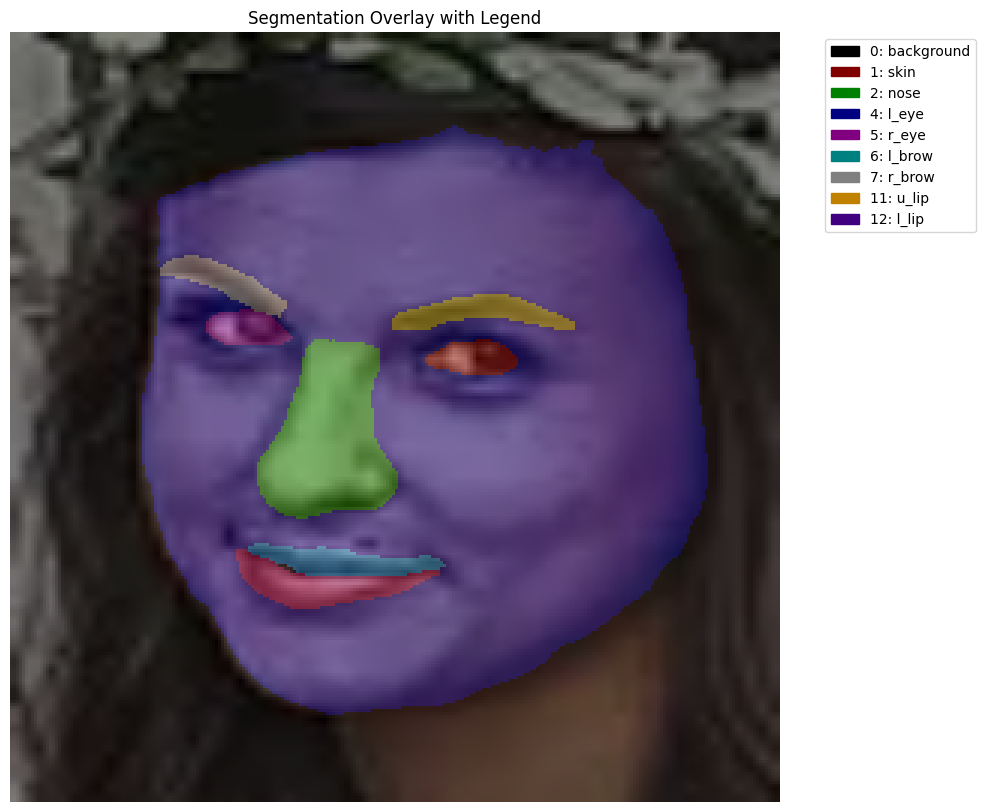

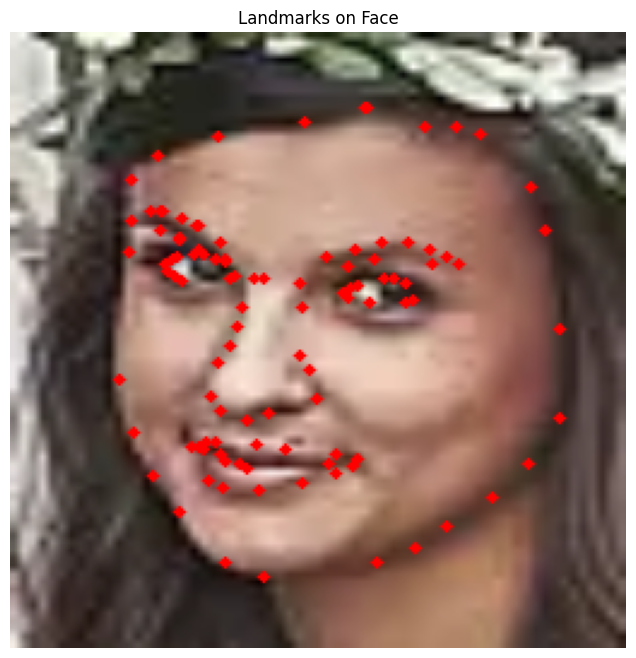

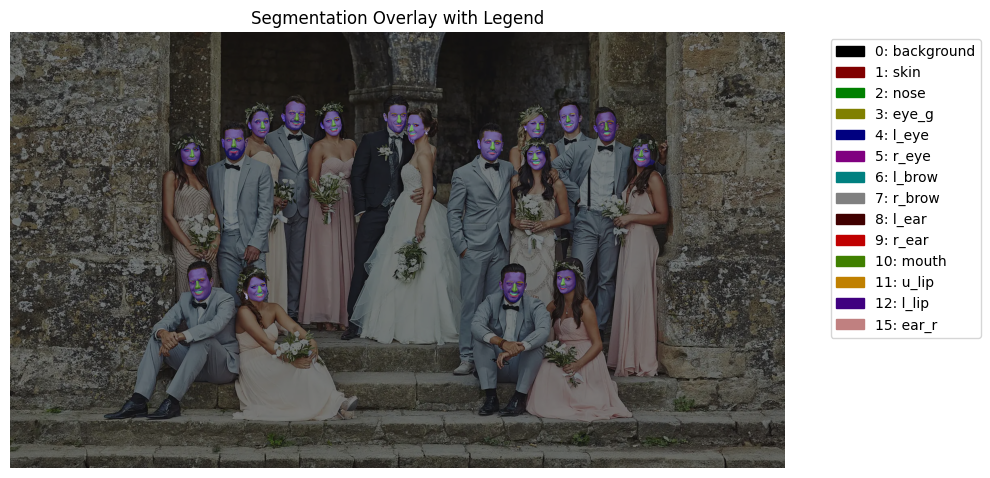

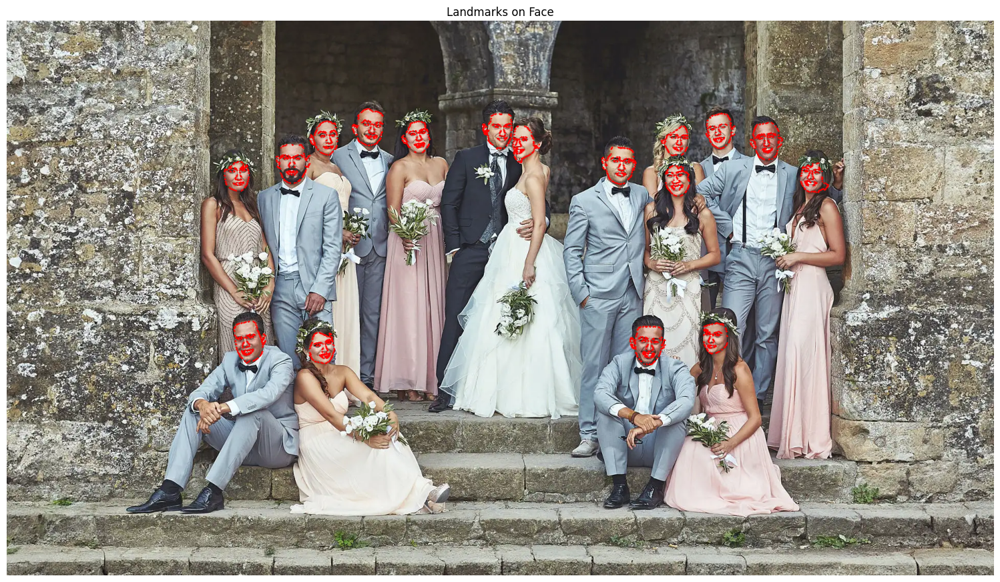

In [42]:
test_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(
        mean=(0.485, 0.456, 0.406),  # ImageNet mean
        std=(0.229, 0.224, 0.225)    # ImageNet std
    ),
    ToTensorV2(),  # [C,H,W] tensor
])

# Load detector
def load_detector(detector="retinaface", use_gpu=False):
    if detector == "retinaface":
        print("✅ Detector retinaface loaded.")
        return "retinaface"
    else:
        raise ValueError("Only 'retinaface' supported in Colab safely.")

# Get face bounding boxes
def get_boxes(detector, image, expand_ratio=0.2):
    h, w = image.shape[:2]
    boxes = []
    if detector == "retinaface":
        try:
            detections = RetinaFace.detect_faces(image)
        except Exception:
            detections = {}
        for key in detections:
            x1, y1, x2, y2 = detections[key]["facial_area"]
            fw, fh = x2 - x1, y2 - y1
            dw, dh = int(fw * expand_ratio), int(fh * expand_ratio)
            x1, y1 = max(0, x1 - dw), max(0, y1 - dh)
            x2, y2 = min(w, x2 + dw), min(h, y2 + dh)
            boxes.append((x1, y1, x2, y2))
    if boxes is not None and len(boxes) > 0:
        return boxes
    else:
        return [[0, 0, w, h]]

# Main pipeline
def run_inference(image_path, modelX, detector_obj, device="cpu"):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    h, w = image.shape[:2]

    # Get face boxes
    boxes = get_boxes(detector_obj, image)
    print("Detected boxes:", boxes)

    overall_mask = np.zeros((h, w), dtype=np.uint8)
    img_list = []

    # ImageNet mean/std for encoder normalization
    mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
    std  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

    for (x1, y1, x2, y2) in boxes:
        crop = image[y1:y2, x1:x2]
        img_list.append(crop)

        # Preprocess crop
        inp_tensor = test_transform(image=crop)["image"]
        inp_tensor = inp_tensor.unsqueeze(0)  # [1,3,H,W]
        inp_tensor = inp_tensor.to(device)

        # Run model
        with torch.no_grad():
            pred = modelX(inp_tensor)  # (1, NUM_CLASSES, H, W)
            pred_mask = torch.argmax(pred, dim=1).cpu().numpy()[0]  # (H, W), class indices

        # Resize mask back to original crop size
        refined_mask = refine_mask_by_islands(pred_mask, label_dict, min_pixels=50)
        temp_img_bgr = cv2.cvtColor(cv2.resize(crop, (256, 256)), cv2.COLOR_RGB2BGR)
        visualize_mask_with_legend(temp_img_bgr, refined_mask, label_dict, colors)
        pred_mask_resized = cv2.resize(refined_mask.astype(np.uint8), (x2 - x1, y2 - y1), interpolation=cv2.INTER_NEAREST)

        landmarks = mask_to_landmark_points(refined_mask, label_dict, total_points=100)
        plot_landmarks_on_image(temp_img_bgr, landmarks)

        overall_mask = update_mask_with_priority(overall_mask, pred_mask_resized, x1, y1, x2, y2)

    temp_image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    visualize_mask_with_legend(temp_image, overall_mask, label_dict, colors)
    landmarks = mask_to_landmark_points(overall_mask, label_dict, total_points=500)
    plot_landmarks_on_image(temp_image, landmarks, 1)


# Load checkpoint
checkpoint_path = testing_checkpoint
state_dict = torch.load(checkpoint_path, map_location=DEVICE)
model.load_state_dict(state_dict)
model.eval()
print("✅ Model loaded and ready.")

# Load detector
detector_obj = load_detector(detector="retinaface")  # safe for Colab

# Run inference
run_inference(
    test_image_path,
    model,
    detector_obj,
    device=DEVICE
)

### Faster for zoomed-in images (bypasses detector)

In [59]:
test_image_path = "temp5.jpg"
testing_checkpoint = "/content/epoch_11.pth"

✅ Model loaded and ready.


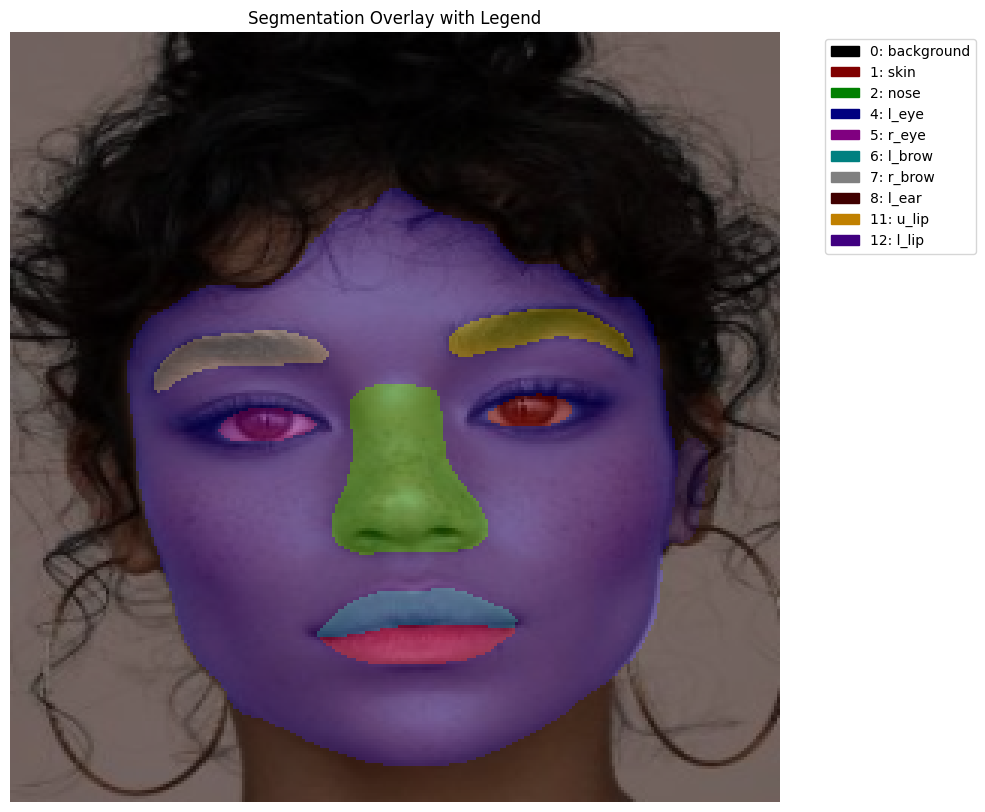

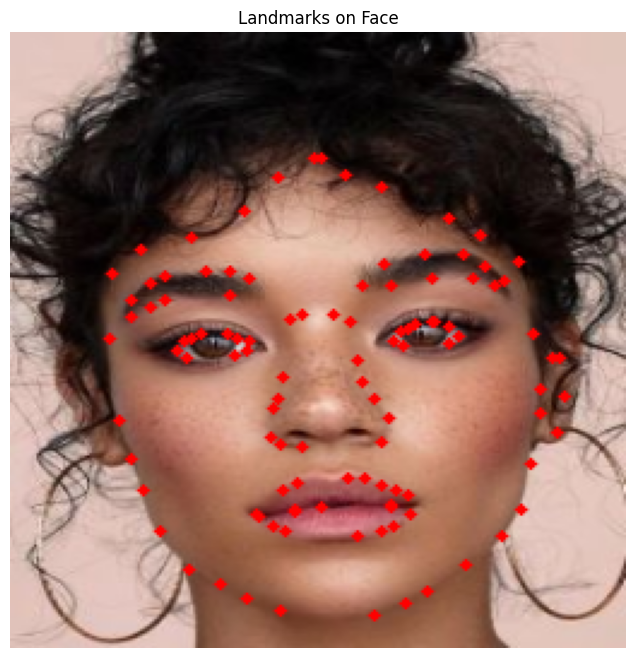

In [79]:
# Load checkpoint
checkpoint_path = testing_checkpoint
state_dict = torch.load(checkpoint_path, map_location=DEVICE)
model.load_state_dict(state_dict)
model.eval()
print("✅ Model loaded and ready.")


# Load image
image_bgr = cv2.imread(test_image_path)   # original image
img_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Resize for model
img_resized = cv2.resize(img_rgb, (256, 256))
input_tensor = transforms.ToTensor()(img_resized).unsqueeze(0).to(DEVICE)

# Run model inference
with torch.no_grad():
    pred = model(input_tensor)  # [1, num_classes, H, W]
    pred_mask = torch.argmax(pred.squeeze(), dim=0).cpu().numpy()


# Resize pred_mask to original image size
pred_mask_resized = cv2.resize(pred_mask, (img_resized.shape[1], img_resized.shape[0]), interpolation=cv2.INTER_NEAREST)
img_bgr_resized = cv2.resize(image_bgr, (256, 256))


# Visualise with refined mask
refined_mask = refine_mask_by_islands(pred_mask_resized, label_dict, min_pixels=50)
visualize_mask_with_legend(img_bgr_resized, refined_mask, label_dict, colors)


# Get landmarks
landmarks = mask_to_landmark_points(refined_mask, label_dict, total_points=100)
plot_landmarks_on_image(img_bgr_resized, landmarks)

# Final footnote

* If additional time and computational resources were available, this project could be extended in several ways to improve performance and robustness:

  * Input and models: Using diverse as well as larger image resolutions or deeper segmentation/landmark networks to capture finer facial details.

  * Multi-task learning: Jointly training for segmentation, landmark detection, and expression recognition to leverage shared features.

  * Data augmentation and synthetic data: Using GANs or advanced augmentation techniques to simulate rare expressions, occlusions, or lighting conditions.

  * Temporal consistency (for video): Incorporating Transformers to stabilize predictions across frames.

  * Ensemble models: Combining multiple architectures (e.g., different encoders or landmark detectors) to reduce model variance and improve accuracy.

  * Explainability and uncertainty: Estimating confidence scores or visualizing attention maps to better understand model predictions.

#### **Personal note**: Although I could not dedicate as much time as I wished due to work commitments, I tried to make the most of the moments I could spare. I sincerely hope the results delivered reflect a decent effort in that spirit.


End of report. Consider this model fully converged.😄